# Let's make some plots of our clusters: do the multiple-clusters events make problems for us?
## And let's do this to learn about pandas and uproot

In [1]:
%load_ext autoreload
%autoreload 2

In [28]:
#import libraries and some constants

import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import scipy.stats as stats

# metadata
layers = ["EMB1", "EMB2", "EMB3", "TileBar0", "TileBar1", "TileBar2"]#calorimeter layer names, B=barrel, EM = for EM showers, Tile=hadronic
cell_size_phi = [0.098, 0.0245, 0.0245, 0.1, 0.1, 0.1]#cell dimensions in these units
cell_size_eta = [0.0031, 0.025, 0.05, 0.1, 0.1, 0.2]
len_phi = [4, 16, 16, 4, 4, 4] #'image sizes' in phi/eta coords
len_eta = [128, 16, 8, 4, 4, 2]

In [3]:
import atlas_mpl_style as ampl #makes matplotlib follow atlas formal style
ampl.use_atlas_style()
# plt.style.use('print')
plotpath = '/home/kaelaekd/start_tf/LCStudies/clusters/Plots/'

In [4]:
# import our resolution utilities

import sys
sys.path.append('/home/kaelaekd/start_tf/LCStudies')
from  util import resolution_util as ru
from  util import plot_util as pu

import uproot as ur
import pandas as pd

Let's load the data: does this work?

In [5]:
path = '/fast_scratch/atlas_images/v7/'

branches = ['clusterIndex', 'truthE', 'nCluster', 'clusterE', 'clusterECalib', 'clusterPt', 'clusterEta', 'clusterPhi', 'cluster_nCells', 'cluster_sumCellE', 'cluster_ENG_CALIB_TOT', 'cluster_ENG_CALIB_OUT_T', 'cluster_ENG_CALIB_DEAD_TOT', 'cluster_EM_PROBABILITY', 'cluster_HAD_WEIGHT', 'cluster_CENTER_MAG', 'cluster_FIRST_ENG_DENS', 'cluster_cellE_norm']
# centermag = depth, engdens = density, can plot like fig 10
#single particle simulation so just pi+, see how detector reacts, one shower, single pion
pp_file = ur.open(path+'piplus.root') #uproot! play with these. acts like a dictionary 
pp_tree = pp_file['ClusterTree']
pp = pd.DataFrame(pp_tree.arrays(expressions = branches, library='np')) #branches are numpy arrays, transform to dataframe

We should define some useful variables in the frame we'll be using again and again

In [6]:
pp['clusterEoverCalib'] = pp.clusterE / pp.cluster_ENG_CALIB_TOT #to define a new pandas column! can do math with it
pp['clusterEoverTruth'] = pp.clusterE / pp.truthE #pp._title_ is the same as pp['title']
#measured E of cluster, eng_calib_tot = truth deposited energy (truth E = truth energy of the original pion), 
#note calorimeters will never get whole pion E since it deposits E before cals as well. so eng_calib_tot tells
#only E deposited in that loc'n 

And now, reduce to just the events with 1 cluster, or the subleading clusters

In [7]:
pp_Single = pp[pp.nCluster==1] #select incidences of one cluster per event. handy pd trick! boolean! t/f for each entry
pp_Multi = pp[(pp.nCluster>1) & (pp.clusterIndex!=0)] #clusterIndex -> order of cluster in event (high/low E)
pp_Leading = pp[pp.nCluster>1][pp.clusterIndex==0]


<ipython-input-7-ad08d6d8b889>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pp_Leading = pp[pp.nCluster>1][pp.clusterIndex==0]


In [8]:
pp_Small = pp[:10]

<Figure size 799.992x599.976 with 0 Axes>

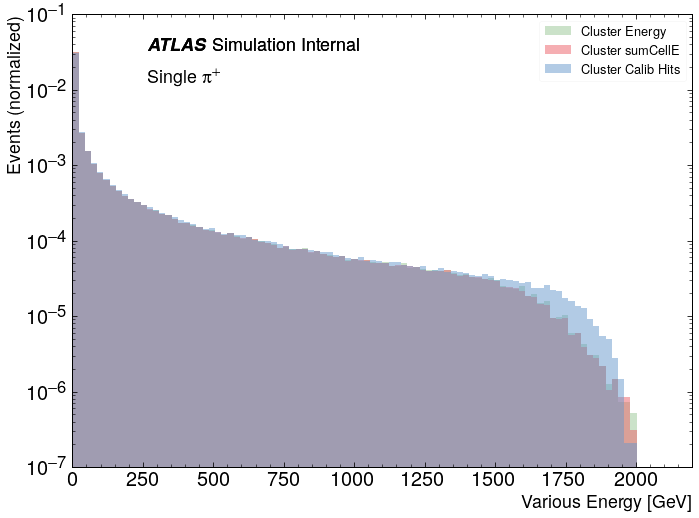

In [9]:
pu.histogramOverlay(frames = [pp, pp, pp], #give 3 frames to plot (same here)
                    data =  ['clusterE', 'cluster_sumCellE', 'cluster_ENG_CALIB_TOT'], #vars to plot
                    labels =['Cluster Energy', 'Cluster sumCellE', 'Cluster Calib Hits'],
                    xlabel = 'Various Energy [GeV]',
                    ylabel = 'Events (normalized)',
                    figfile = plotpath + '/hist_energy.pdf',
                    x_min = 0, x_max = 2200, xbins = 100, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$'}])

<Figure size 799.992x599.976 with 0 Axes>

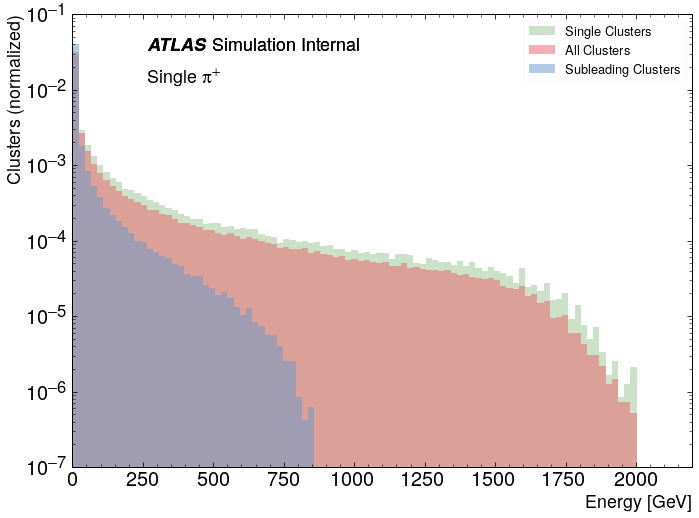

In [10]:
pu.histogramOverlay(frames = [pp_Single, pp, pp_Multi], #different selections
                    data =  ['clusterE', 'clusterE', 'clusterE'],
                    labels =['Single Clusters', 'All Clusters', 'Subleading Clusters'],
                    xlabel = 'Energy [GeV]',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_energy_SingleMulti.pdf',
                    x_min = 0, x_max = 2200, xbins = 100, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$'}])
#note normalized - divided by number of entries for ease of comparison of shapes. by normed=True

<Figure size 799.992x599.976 with 0 Axes>

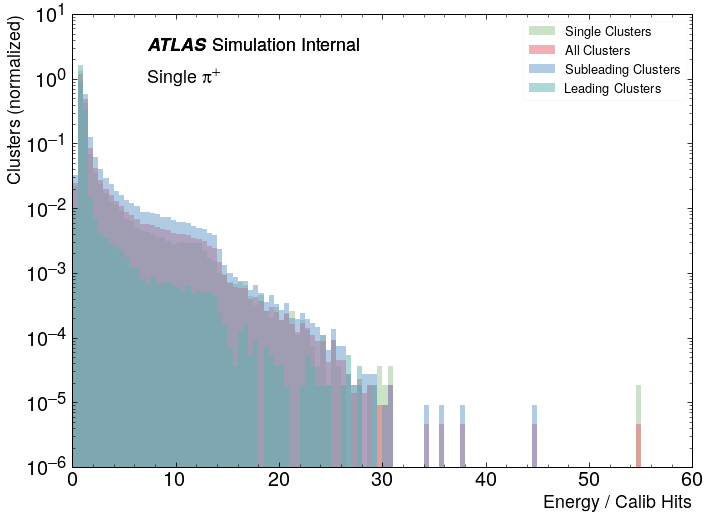

In [11]:
pu.histogramOverlay(frames = [pp_Single, pp, pp_Multi, pp_Leading],
                    data =  ['clusterEoverCalib', 'clusterEoverCalib', 'clusterEoverCalib', 'clusterEoverCalib'],
                    labels =['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters'],
                    xlabel = 'Energy / Calib Hits',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_response_SingleMulti.pdf',
                    x_min = 0, x_max = 60, xbins = 120, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$'}])

<Figure size 799.992x599.976 with 0 Axes>

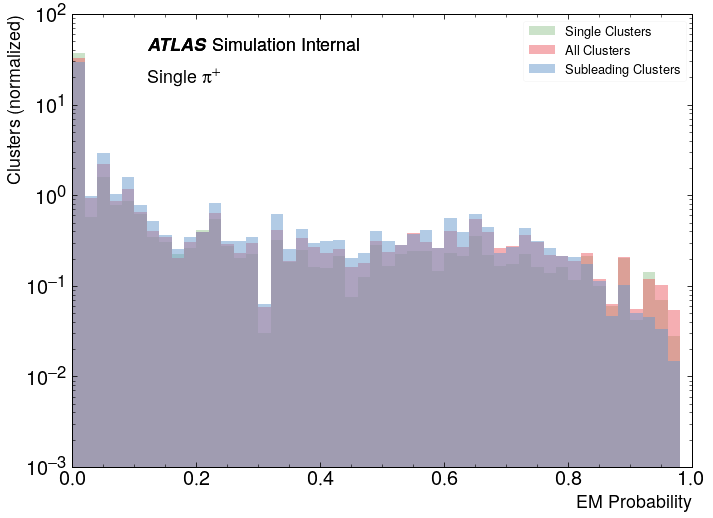

In [12]:
pu.histogramOverlay(frames = [pp_Single, pp, pp_Multi],
                    data =  ['cluster_EM_PROBABILITY', 'cluster_EM_PROBABILITY', 'cluster_EM_PROBABILITY'],
                    labels =['Single Clusters', 'All Clusters', 'Subleading Clusters'],
                    xlabel = 'EM Probability',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_emResponse_SingleMulti.pdf',
                    x_min = 0, x_max = 1, xbins = 50, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$'}])

All these are looking super consistent so far

<Figure size 799.992x599.976 with 0 Axes>

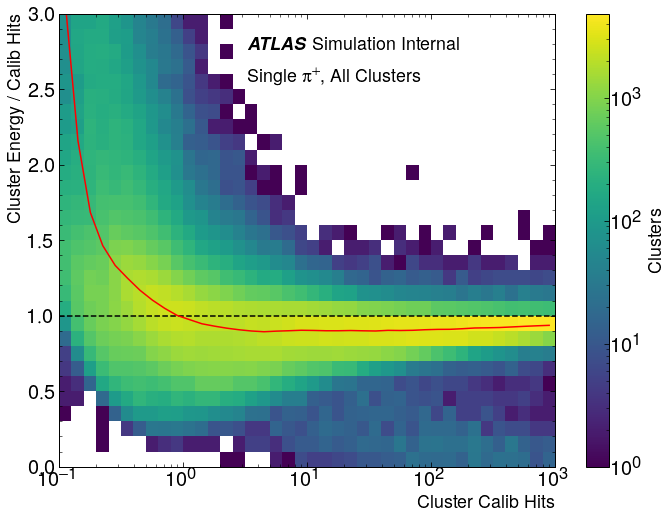

In [13]:
xcenter, medAll = ru.responsePlot(pp.cluster_ENG_CALIB_TOT, pp.clusterEoverCalib, #x, y
                    figfile = plotpath+'hist_2D_calib_vs_ratio_pp_profile.pdf', statistic = 'median',
                    atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'}])
#1.0 is where we measure all E; expected b/c charged pions interact w nuclei but we measure based on e- ionizations
#want to minimize width - ie improve resolution (ie close to zero is best)
#red line gives center

<Figure size 799.992x599.976 with 0 Axes>

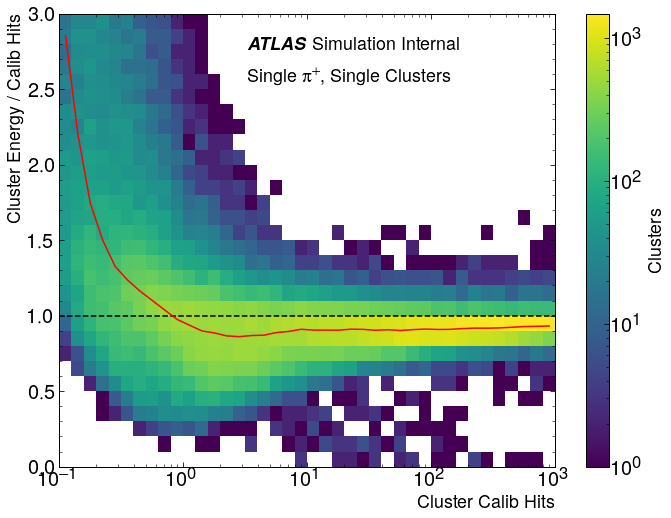

In [14]:
xcenter, medSingle = ru.responsePlot(pp_Single.cluster_ENG_CALIB_TOT, 
                      pp_Single.clusterEoverCalib, 
                      figfile = plotpath+'hist_2D_calib_vs_ratio_pp_profile_Single.pdf', statistic = 'median',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

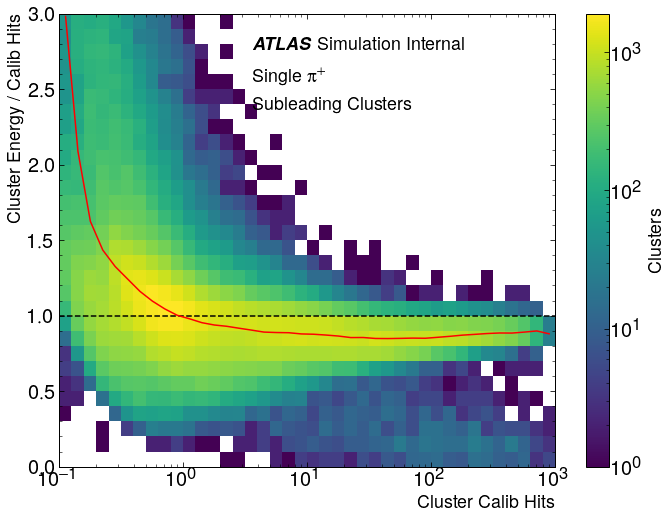

In [15]:
xcenter, medMulti = ru.responsePlot(pp_Multi.cluster_ENG_CALIB_TOT, 
                      pp_Multi.clusterEoverCalib, 
                      figfile = plotpath+'hist_2D_calib_vs_ratio_pp_profile_Multi.pdf', statistic = 'median',
                      atlas_x = 0.39, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.39, 'y': 0.85, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.39, 'y': 0.79, 'text': 'Subleading Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

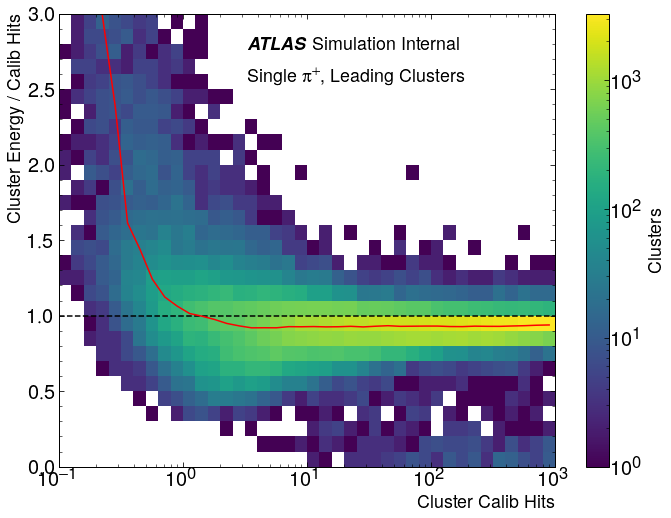

In [16]:
xcenter, medLeading = ru.responsePlot(pp_Leading.cluster_ENG_CALIB_TOT, 
                      pp_Leading.clusterEoverCalib, 
                      figfile = plotpath+'hist_2D_calib_vs_ratio_pp_profile_Leading.pdf', statistic = 'median',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Leading Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

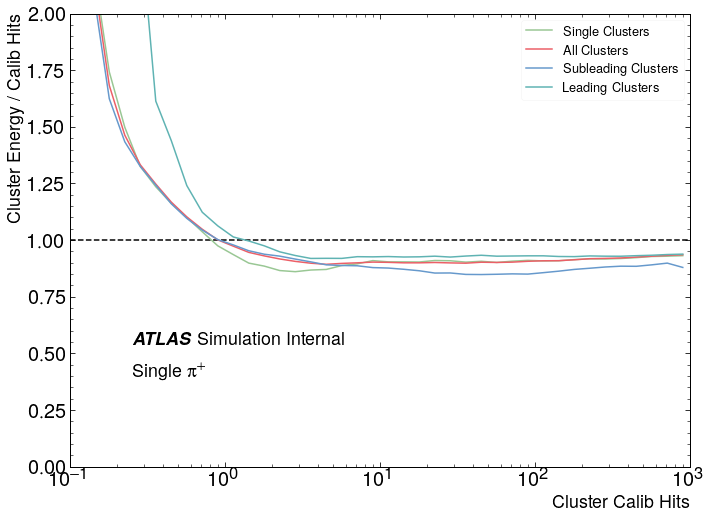

In [17]:
pu.lineOverlay(xcenter=xcenter, lines = [medSingle, medAll, medMulti, medLeading],
                labels=['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                figfile = plotpath + 'hist_2D_calib_vs_ratio_pp_profile_Overlay.pdf',
                extra_lines=[[[0.1,1000],[1,1]]],
                atlas_x = 0.1, atlas_y = 0.3, simulation = True,
                textlist = [{'x': 0.1, 'y': 0.2, 'text': 'Single $\pi^{+}$'}])

In general the response also all looks ok as a function of the calib hits. Biggest difference is in the leading clusters at low truth energy.

<Figure size 799.992x599.976 with 0 Axes>

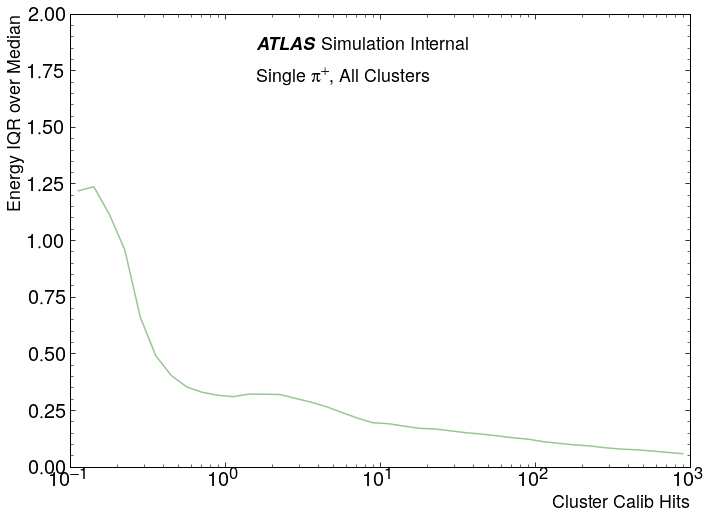

In [18]:
xcenter, iqrOverMedAll = ru.resolutionPlot(pp.cluster_ENG_CALIB_TOT, pp.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_pp_iqrMed.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

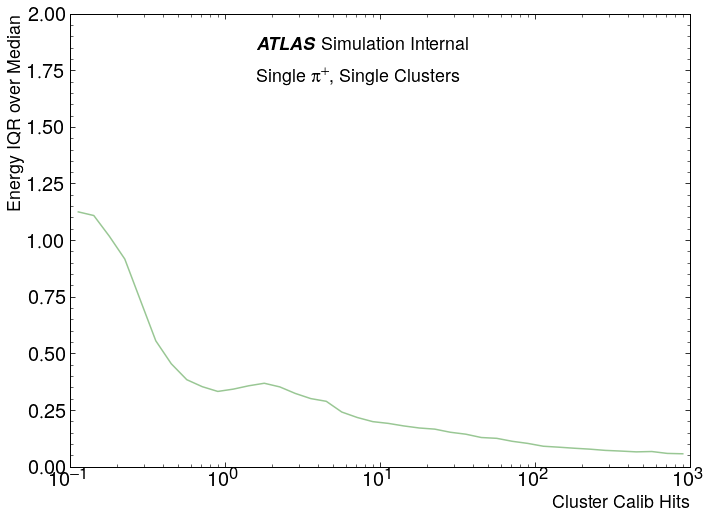

In [19]:
xcenter, iqrOverMedSingle = ru.resolutionPlot(pp_Single.cluster_ENG_CALIB_TOT, pp_Single.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_pp_iqrMed_Single.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

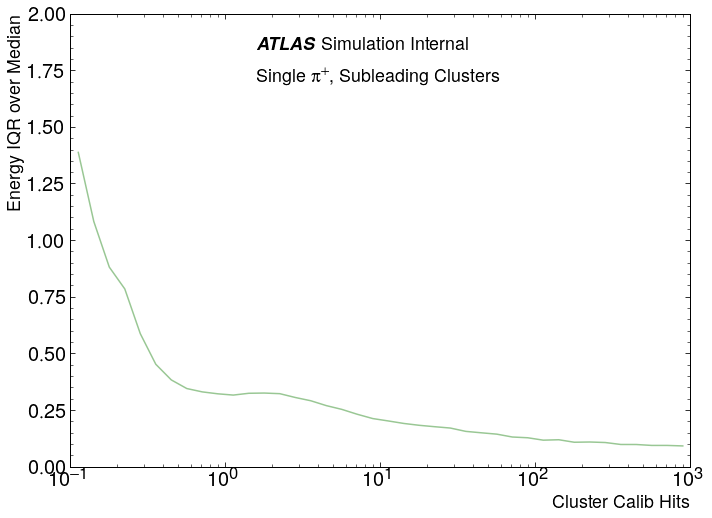

In [20]:
xcenter, iqrOverMedMulti = ru.resolutionPlot(pp_Multi.cluster_ENG_CALIB_TOT, 
                            pp_Multi.cluster_ENG_CALIB_TOT/pp_Multi.clusterE,
                            plotpath+'hist_2D_calib_vs_ratio_pp_iqrMed_Multi.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{+}$, Subleading Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

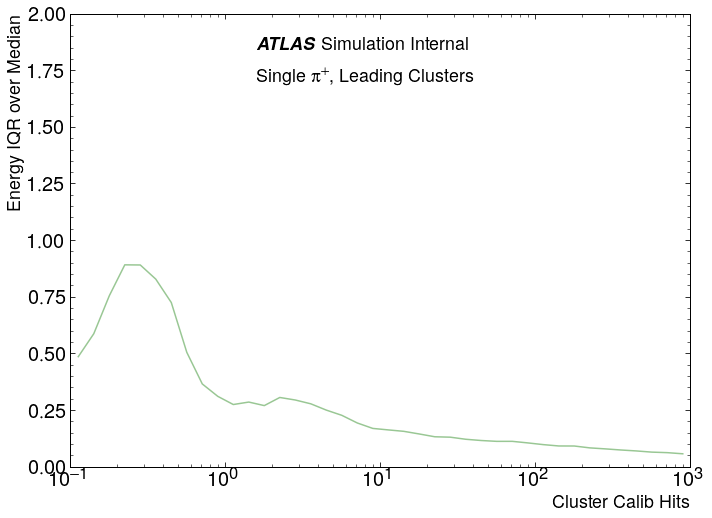

In [21]:
xcenter, iqrOverMedLeading = ru.resolutionPlot(pp_Leading.cluster_ENG_CALIB_TOT, 
                            pp_Leading.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_pp_iqrMed_Leading.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{+}$, Leading Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

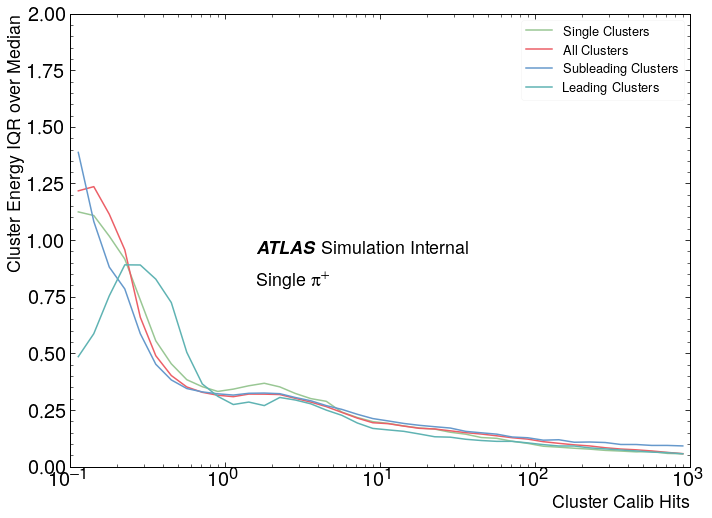

In [22]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedSingle, iqrOverMedAll, iqrOverMedMulti, iqrOverMedLeading],
                labels=['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy IQR over Median',
                figfile = plotpath + 'hist_2D_calib_vs_ratio_pp_iqrMed_Overlay.pdf',
                x_min = 0.1, x_max = 1000, x_log = True,
                y_min = 0, y_max=2, y_log=False,
                atlas_x = 0.3, atlas_y = 0.5, simulation = True,
                textlist = [{'x': 0.3, 'y': 0.4, 'text': 'Single $\pi^{+}$'}])

Resolutions all look pretty compatible too: no big difference in one or the other, which is comforting! Some differences for leading clusters in events with multiple clusters.

Is this a sorting bias? By definition they have higher energies. Probably something like this.

## Should switch over to pi0 too to validate this

In [24]:
p0_file = ur.open(path+'pi0.root')
p0_tree = p0_file['ClusterTree']
p0 = pd.DataFrame(p0_tree.arrays(expressions = branches, library='np'))

In [25]:
p0['clusterEoverCalib'] = p0.clusterE / p0.cluster_ENG_CALIB_TOT

In [26]:
p0_Single = p0[p0.nCluster==1]
p0_Multi  = p0[p0.nCluster>1][p0.clusterIndex!=0]
p0_Leading =  p0[p0.nCluster>1][p0.clusterIndex==0]

<ipython-input-26-068b5b9d7beb>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  p0_Multi  = p0[p0.nCluster>1][p0.clusterIndex!=0]
<ipython-input-26-068b5b9d7beb>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  p0_Leading =  p0[p0.nCluster>1][p0.clusterIndex==0]


<Figure size 799.992x599.976 with 0 Axes>

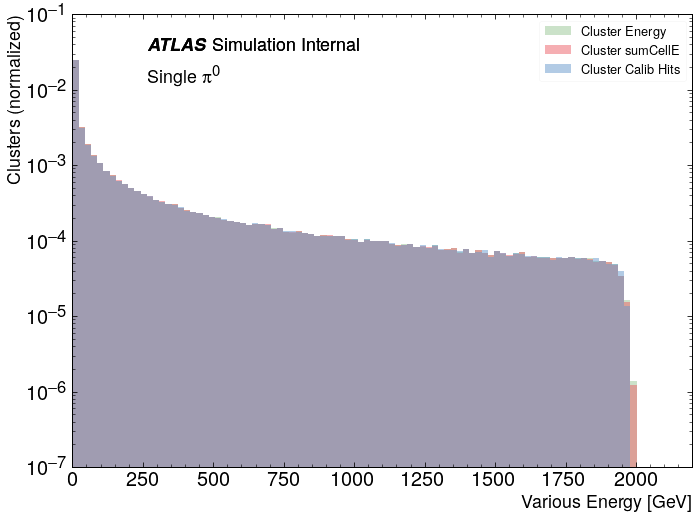

In [27]:
pu.histogramOverlay(frames = [p0, p0, p0],
                    data =  ['clusterE', 'cluster_sumCellE', 'cluster_ENG_CALIB_TOT'],
                    labels =['Cluster Energy', 'Cluster sumCellE', 'Cluster Calib Hits'],
                    xlabel = 'Various Energy [GeV]',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_p0_energy.pdf',
                    x_min = 0, x_max = 2200, xbins = 100, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{0}$'}])

<Figure size 576x432 with 0 Axes>

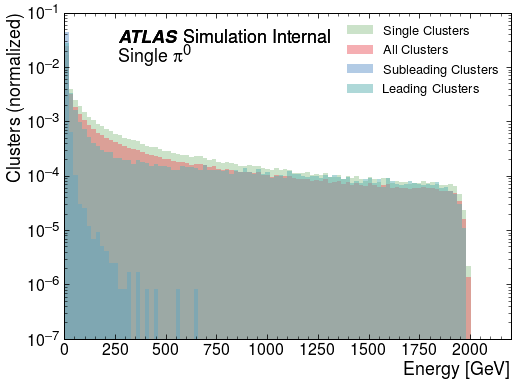

In [27]:
pu.histogramOverlay(frames = [p0_Single, p0, p0_Multi, p0_Leading],
                    data =  ['clusterE', 'clusterE', 'clusterE', 'clusterE'],
                    labels =['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters'],
                    xlabel = 'Energy [GeV]',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_p0_energy_SingleMulti.pdf',
                    x_min = 0, x_max = 2200, xbins = 100, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{0}$'}])

<Figure size 576x432 with 0 Axes>

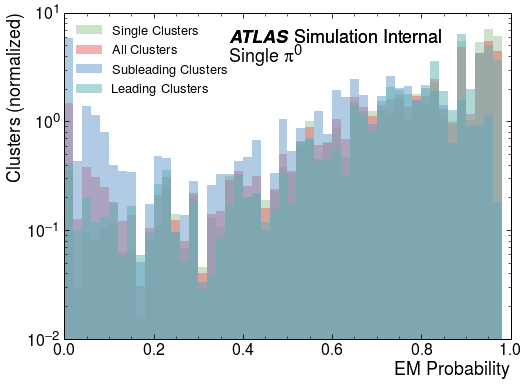

In [28]:
pu.histogramOverlay(frames = [p0_Single, p0, p0_Multi, p0_Leading],
                    data =  ['cluster_EM_PROBABILITY', 'cluster_EM_PROBABILITY', 'cluster_EM_PROBABILITY', 'cluster_EM_PROBABILITY'],
                    labels =['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters'],
                    xlabel = 'EM Probability',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_p0_emResponse_SingleMulti.pdf',
                    x_min = 0, x_max = 1, xbins = 50, normed = True, y_log = True,
                    atlas_x = 0.37, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.37, 'y': 0.85, 'text': 'Single $\pi^{0}$'}])

Subleading clusters look less EM like-- interesting

<Figure size 576x432 with 0 Axes>

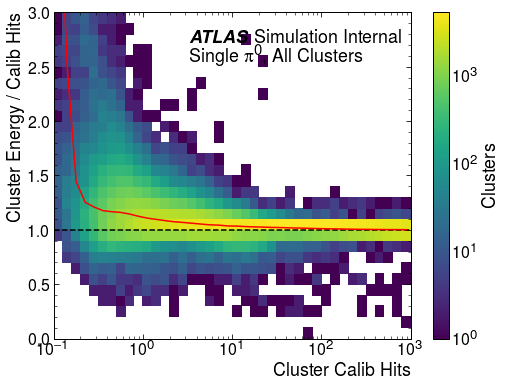

In [29]:
xcenter, medp0All = ru.responsePlot(p0.cluster_ENG_CALIB_TOT, p0.clusterEoverCalib, 
                    figfile = plotpath+'hist_2D_calib_vs_ratio_p0_profile.pdf', statistic = 'median',
                    atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{0}$, All Clusters'}])

<Figure size 576x432 with 0 Axes>

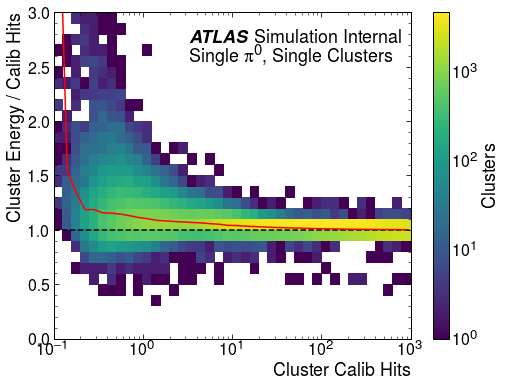

In [30]:
xcenter, medp0Single = ru.responsePlot(p0_Single.cluster_ENG_CALIB_TOT, p0_Single.clusterEoverCalib, 
                        figfile = plotpath+'hist_2D_calib_vs_ratio_p0_profile_Single.pdf', statistic = 'median',
                        atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                        textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{0}$, Single Clusters'}])

<Figure size 576x432 with 0 Axes>

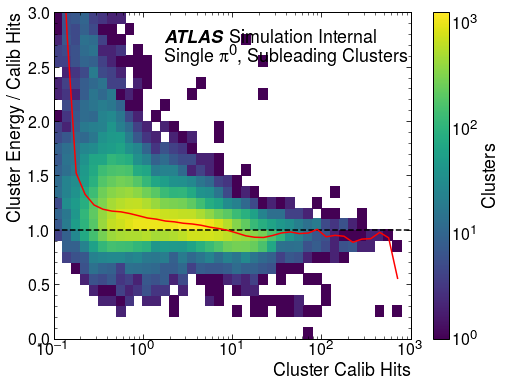

In [31]:
xcenter, medp0Multi = ru.responsePlot(p0_Multi.cluster_ENG_CALIB_TOT, p0_Multi.clusterEoverCalib, 
                        figfile = plotpath+'hist_2D_calib_vs_ratio_p0_profile_Multi.pdf', statistic = 'median',
                        atlas_x = 0.31, atlas_y = 0.95, simulation = True,
                        textlist = [{'x': 0.31, 'y': 0.85, 'text': 'Single $\pi^{0}$, Subleading Clusters'}])

<Figure size 576x432 with 0 Axes>

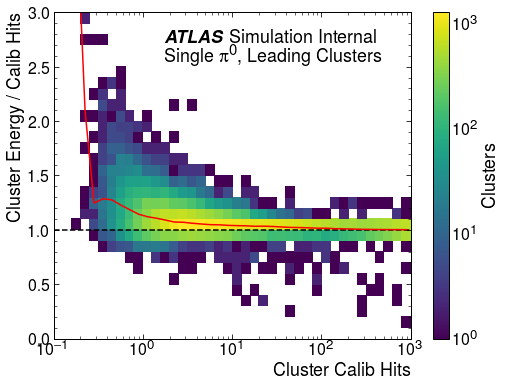

In [32]:
xcenter, medp0Leading = ru.responsePlot(p0_Leading.cluster_ENG_CALIB_TOT, p0_Leading.clusterEoverCalib, 
                        figfile = plotpath+'hist_2D_calib_vs_ratio_p0_profile_Leading.pdf', statistic = 'median',
                        atlas_x = 0.31, atlas_y = 0.95, simulation = True,
                        textlist = [{'x': 0.31, 'y': 0.85, 'text': 'Single $\pi^{0}$, Leading Clusters'}])

<Figure size 576x432 with 0 Axes>

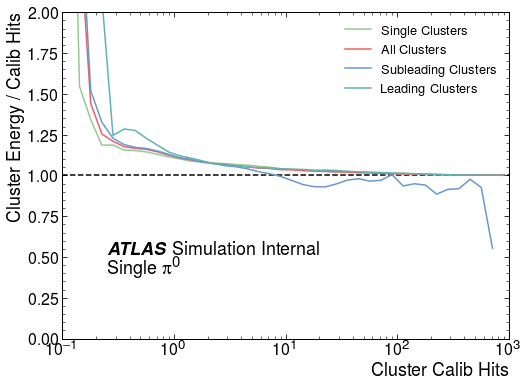

In [33]:
pu.lineOverlay(xcenter=xcenter, lines = [medp0Single, medp0All, medp0Multi, medp0Leading],
                labels=['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                figfile = plotpath + 'hist_2D_calib_vs_ratio_p0_profile_Overlay.pdf',
                extra_lines=[[[0.1,1000],[1,1]]],
                atlas_x = 0.1, atlas_y = 0.3, simulation = True,
                textlist = [{'x': 0.1, 'y': 0.2, 'text': 'Single $\pi^{0}$'}])

<Figure size 576x432 with 0 Axes>

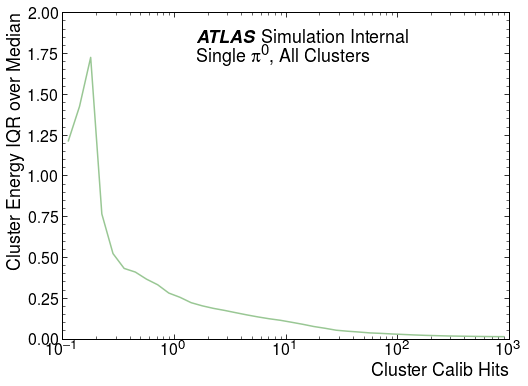

In [34]:
xcenter, iqrOverMedp0All = ru.resolutionPlot(p0.cluster_ENG_CALIB_TOT, p0.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_p0_iqrMed.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{0}$, All Clusters'}])

<Figure size 576x432 with 0 Axes>

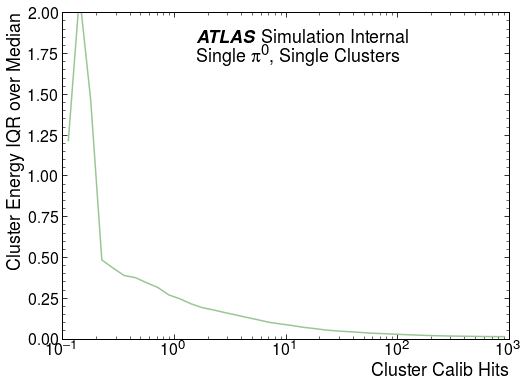

In [35]:
xcenter, iqrOverMedp0Single = ru.resolutionPlot(p0_Single.cluster_ENG_CALIB_TOT, p0_Single.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_p0_iqrMed_Single.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{0}$, Single Clusters'}])

<Figure size 576x432 with 0 Axes>

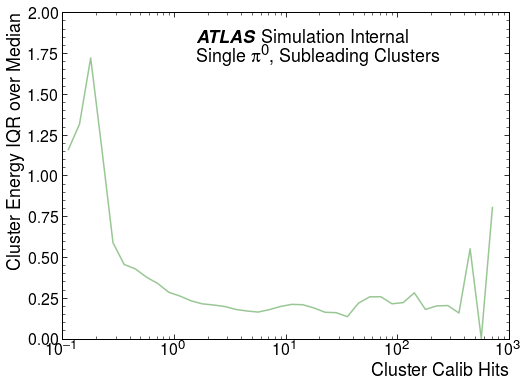

In [36]:
xcenter, iqrOverMedp0Multi = ru.resolutionPlot(p0_Multi.cluster_ENG_CALIB_TOT, p0_Multi.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_p0_iqrMed_Multi.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{0}$, Subleading Clusters'}])

<Figure size 576x432 with 0 Axes>

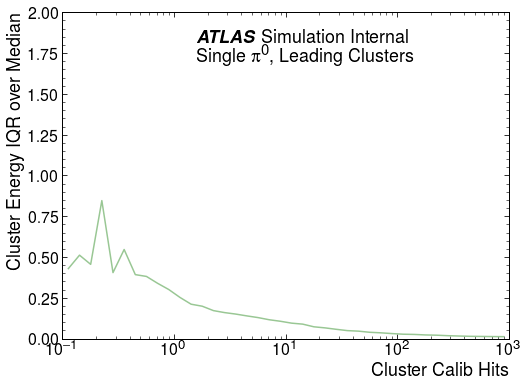

In [37]:
xcenter, iqrOverMedp0Leading = ru.resolutionPlot(p0_Leading.cluster_ENG_CALIB_TOT,  
                            p0_Leading.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_p0_iqrMed_Leading.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{0}$, Leading Clusters'}])

<Figure size 576x432 with 0 Axes>

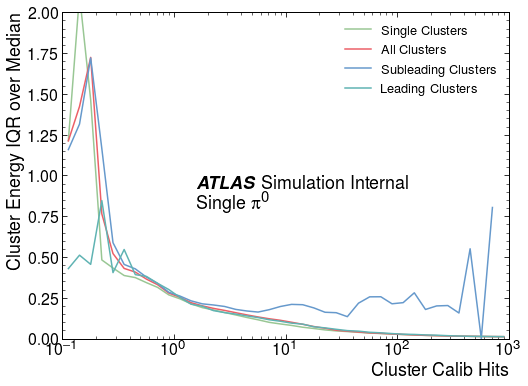

In [38]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedp0Single, iqrOverMedp0All, iqrOverMedp0Multi, iqrOverMedp0Leading],
                labels=['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy IQR over Median',
                figfile = plotpath + 'hist_2D_calib_vs_ratio_p0_iqrMed_Overlay.pdf',
                x_min = 0.1, x_max = 1000, x_log = True,
                y_min = 0, y_max=2, y_log=False,
                atlas_x = 0.3, atlas_y = 0.5, simulation = True,
                textlist = [{'x': 0.3, 'y': 0.4, 'text': 'Single $\pi^{0}$'}])

Some differences, but ok-- fairly consistent in general

Finally, what are the plain old numbers going around here?

In [39]:
print('Number of all pi+ clusters: {}'. format(len(pp)))
print('Number of single pi+ clusters: {}'. format(len(pp_Single)))
print('Number of subleading pi+ clusters: {}'. format(len(pp_Multi)))
print('Number of leading pi+ clusters: {}'. format(len(pp_Leading)))

print('Number of all pi0 clusters: {}'. format(len(p0)))
print('Number of single pi0 clusters: {}'. format(len(p0_Single)))
print('Number of subleading pi0 clusters: {}'. format(len(p0_Multi)))
print('Number of leading pi0 clusters: {}'. format(len(p0_Leading)))

Number of all pi+ clusters: 435967
Number of single pi+ clusters: 108263
Number of subleading pi+ clusters: 217707
Number of leading pi+ clusters: 109997
Number of all pi0 clusters: 263891
Number of single pi0 clusters: 163985
Number of subleading pi0 clusters: 53914
Number of leading pi0 clusters: 45992


This seems all consistent.

# Another question: what's the DR between truth and the clusters? Kaela stop here

/home/mswiatlowski/start_tf/caloml-atlas/util/plot_util.py:32: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alpha = 0.5, label=labels[i], zorder=zorder_start + i)


<Figure size 576x432 with 0 Axes>

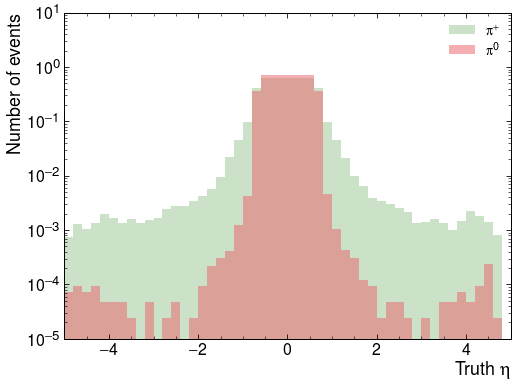

In [40]:
pu.histogramOverlay([pp[pp.clusterIndex==0], p0[p0.clusterIndex==0]], ['truthEta', 'truthEta'], ['$\pi^{+}$', '$\pi^{0}$'], 'Truth $\eta$', 'Number of events',x_min = -5, x_max = 5, xbins = 50, y_log = True)

So for these studies, get rid of things beyond truth eta 0.5, since there is a reco cut of 0.7 already. This means for this subset of events, we *know* the truth particle is within the fiducial region we've defined (assuming the resolution isn't worse than 0.2...)

In [41]:
pp_Eta = pp[np.abs(pp.truthEta) < 0.5]
p0_Eta = p0[np.abs(p0.truthEta) < 0.5]

In [42]:
print(len(pp_Eta))
print(len(p0_Eta))

291148
189398


In [43]:
pp_Several = pp_Eta[(pp_Eta.nCluster>1)]


In [44]:
import uproot_methods as urm

In [45]:
pp_Eta['clusterVec'] = pp_Eta.apply(lambda cluster: urm.PtEtaPhiMassLorentzVector(cluster.clusterPt, cluster.clusterEta, cluster.clusterPhi, 0), axis=1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


<Figure size 576x432 with 0 Axes>

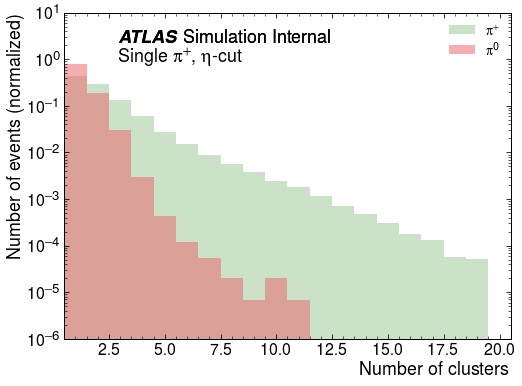

In [46]:
pu.histogramOverlay([pp_Eta[pp_Eta.clusterIndex==0], p0_Eta[p0_Eta.clusterIndex==0]], ['nCluster', 'nCluster'], ['$\pi^{+}$', '$\pi^{0}$'], 'Number of clusters', 'Number of events (normalized)',x_min = 0.5, x_max = 20.5, xbins = 20, y_log = True,
figfile=plotpath+'hist_numClusters_etaCut.pdf',
atlas_x = 0.12, atlas_y = 0.95, simulation = True, textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'}])

In [47]:
pp_Eta['truthVec'] = pp_Eta.apply(lambda cluster: urm.PtEtaPhiMassLorentzVector(cluster.truthPt, cluster.truthEta, cluster.truthPhi, 0.13957), axis = 1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [48]:
pp_Eta['clusterDRTruth'] = pp_Eta.apply(lambda cluster: np.sqrt(cluster.truthVec.delta_r2(cluster.clusterVec)), axis = 1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [49]:
p0_Eta['clusterVec'] = p0_Eta.apply(lambda cluster: urm.PtEtaPhiMassLorentzVector(cluster.clusterPt, cluster.clusterEta, cluster.clusterPhi, 0), axis=1)
p0_Eta['truthVec'] = p0_Eta.apply(lambda cluster: urm.PtEtaPhiMassLorentzVector(cluster.truthPt, cluster.truthEta, cluster.truthPhi, 0.134976), axis = 1)
p0_Eta['clusterDRTruth'] = p0_Eta.apply(lambda cluster: np.sqrt(cluster.truthVec.delta_r2(cluster.clusterVec)), axis = 1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

<Figure size 576x432 with 0 Axes>

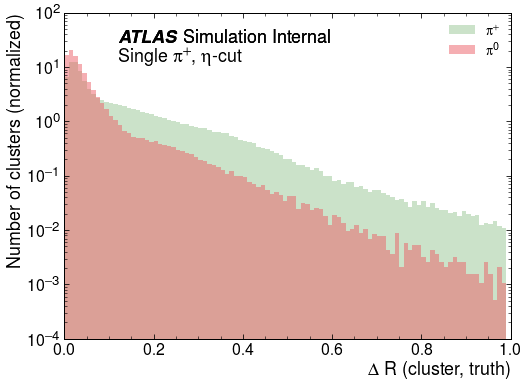

In [50]:
pu.histogramOverlay([pp_Eta, p0_Eta], ['clusterDRTruth', 'clusterDRTruth'], ['$\pi^{+}$', '$\pi^{0}$'], '$\Delta$ R (cluster, truth)', 'Number of clusters (normalized)',x_min = 0., x_max = 1, xbins = 100, y_log = True,
figfile=plotpath+'hist_DRTruth_etaCut.pdf',
atlas_x = 0.12, atlas_y = 0.95, simulation = True, textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'}])

<Figure size 576x432 with 0 Axes>

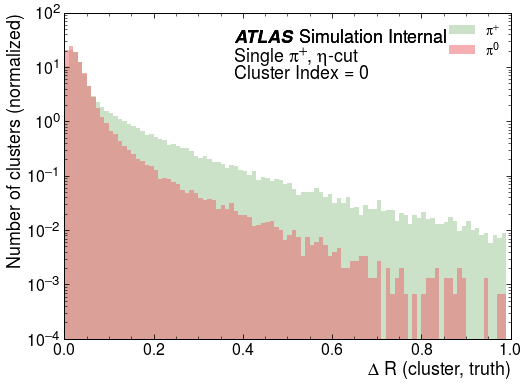

<Figure size 576x432 with 0 Axes>

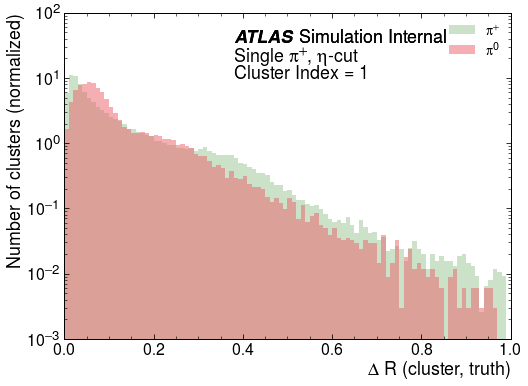

<Figure size 576x432 with 0 Axes>

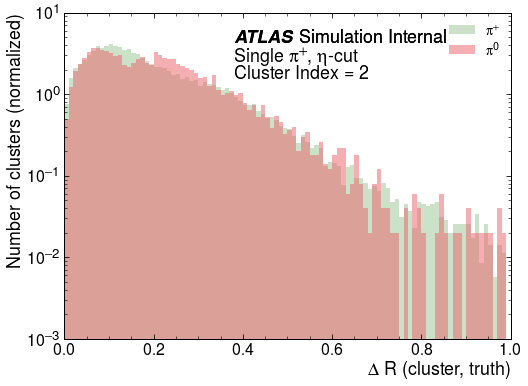

<Figure size 576x432 with 0 Axes>

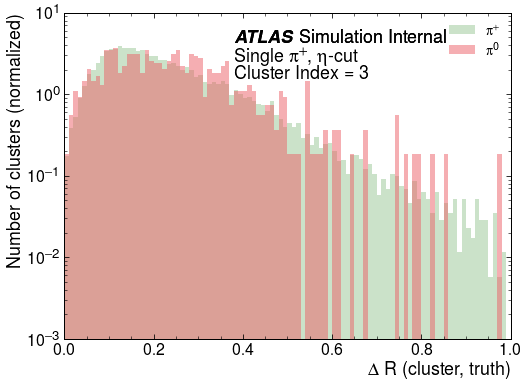

<Figure size 576x432 with 0 Axes>

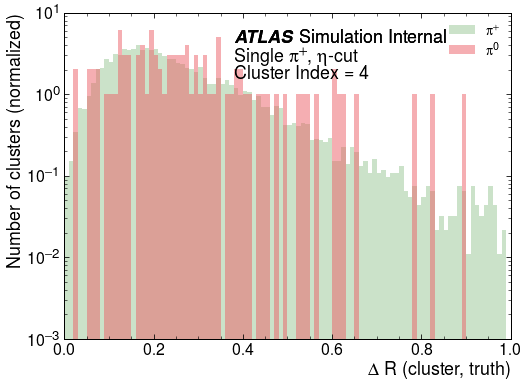

<Figure size 576x432 with 0 Axes>

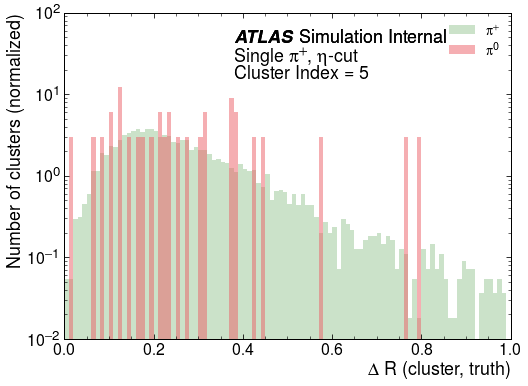

<Figure size 576x432 with 0 Axes>

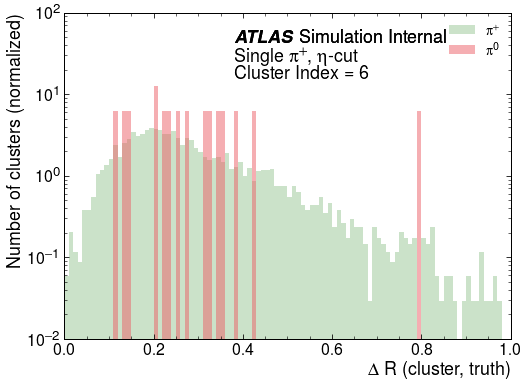

<Figure size 576x432 with 0 Axes>

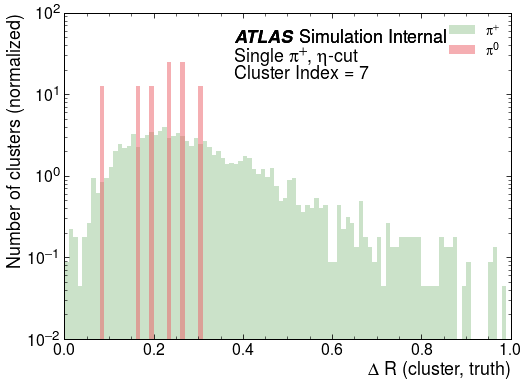

<Figure size 576x432 with 0 Axes>

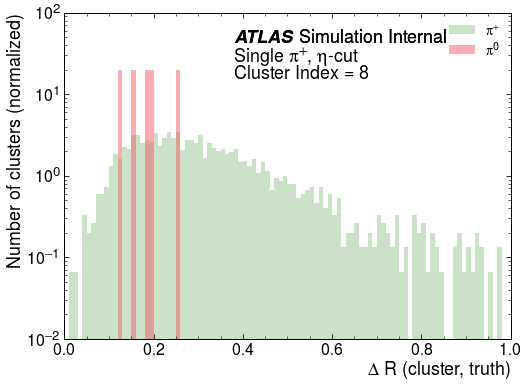

<Figure size 576x432 with 0 Axes>

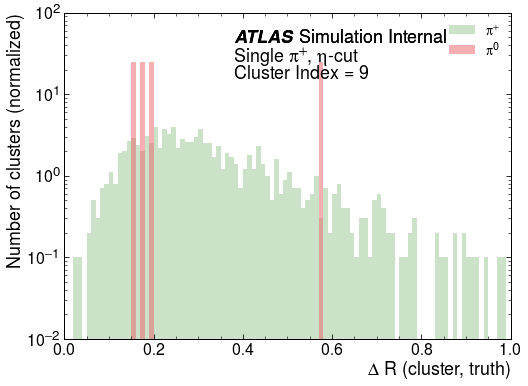

In [51]:
for i in range(10):
    pu.histogramOverlay([pp_Eta[pp_Eta.clusterIndex==i], p0_Eta[p0_Eta.clusterIndex==i]],
                         ['clusterDRTruth', 'clusterDRTruth'], ['$\pi^{+}$', '$\pi^{0}$'], '$\Delta$ R (cluster, truth)',   
                         'Number of clusters (normalized)',x_min = 0., x_max = 1, xbins = 100, y_log = True,
                         figfile=plotpath+'hist_DRTruth_etaCut_CI{}.pdf'.format(i),
                         atlas_x = 0.38, atlas_y = 0.95, simulation = True, 
                         textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'},
                                     {'x': 0.38, 'y': 0.8, 'text': 'Cluster Index = {}'.format(i)}])

In [52]:
pp_Weird = pp_Eta[(pp_Eta.clusterIndex==0) & (pp_Eta.clusterDRTruth > 0.8)]

In [53]:
len(pp_Weird)

588

<Figure size 576x432 with 0 Axes>

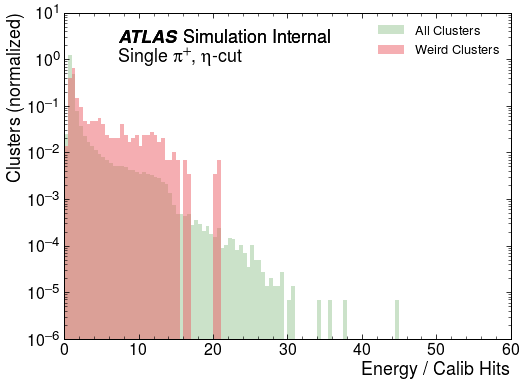

In [54]:
pu.histogramOverlay(frames = [pp_Eta, pp_Weird],
                    data =  ['clusterEoverCalib','clusterEoverCalib'],
                    labels =['All Clusters', 'Weird Clusters'],
                    xlabel = 'Energy / Calib Hits',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_response_weird_etaCut.pdf',
                    x_min = 0, x_max = 60, xbins = 120, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'}])

So there are definitely cases of energy fairly far from the initial particle, and looking somewhat weird for it. Here, we see the response is higher for these.

<Figure size 576x432 with 0 Axes>

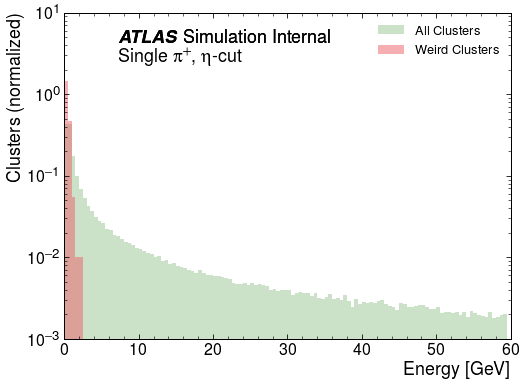

In [55]:
pu.histogramOverlay(frames = [pp_Eta, pp_Weird],
                    data =  ['clusterE','clusterE'],
                    labels =['All Clusters', 'Weird Clusters'],
                    xlabel = 'Energy [GeV]',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_energy_weird_etaCut.pdf',
                    x_min = 0, x_max = 60, xbins = 120, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'}])

Ok, so they're almost all low energy stuff. That's reassuring. Should we filter them out? Let's apply a DR < 0.075 cut: fairly tight to get rid of junk.

In [56]:
pp_Cleaned = pp_Eta[pp_Eta.clusterDRTruth < 0.075]

In [57]:
len(pp_Cleaned)

156519

In [58]:
pp_Bad = pp_Eta[pp_Eta.clusterDRTruth >= 0.075]

In [59]:
len(pp_Bad)

134629

<Figure size 576x432 with 0 Axes>

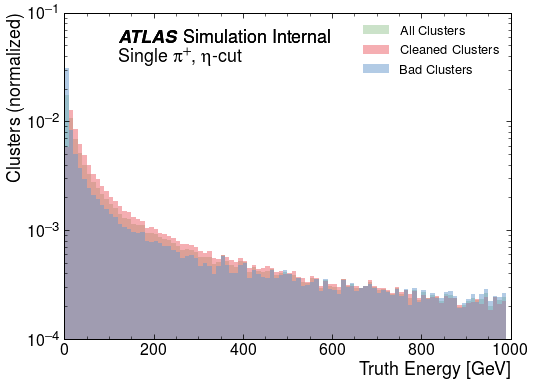

In [60]:
pu.histogramOverlay(frames = [pp_Eta, pp_Cleaned, pp_Bad],
                    data =  ['truthE','truthE', 'truthE'],
                    labels =['All Clusters', 'Cleaned Clusters', 'Bad Clusters'],
                    xlabel = 'Truth Energy [GeV]',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_truthEnergy_etaCutClean.pdf',
                    x_min = 0, x_max = 1000, xbins = 100, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'}])

<Figure size 576x432 with 0 Axes>

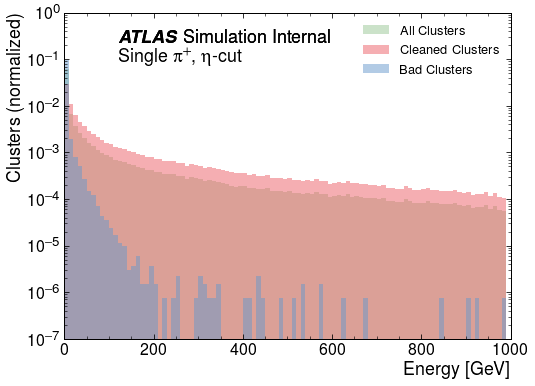

In [61]:
pu.histogramOverlay(frames = [pp_Eta, pp_Cleaned, pp_Bad],
                    data =  ['clusterE','clusterE', 'clusterE'],
                    labels =['All Clusters', 'Cleaned Clusters', 'Bad Clusters'],
                    xlabel = 'Energy [GeV]',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_energy_etaCutClean.pdf',
                    x_min = 0, x_max = 1000, xbins = 100, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'}])

<Figure size 576x432 with 0 Axes>

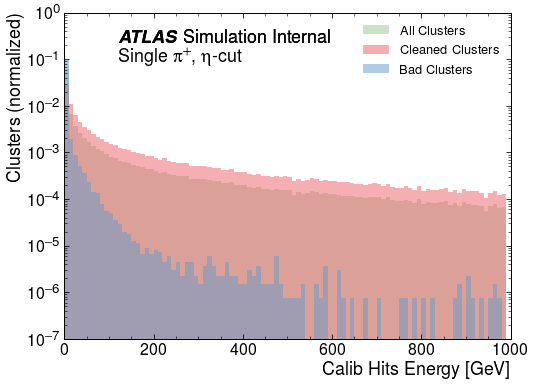

In [62]:
pu.histogramOverlay(frames = [pp_Eta, pp_Cleaned, pp_Bad],
                    data =  ['cluster_ENG_CALIB_TOT','cluster_ENG_CALIB_TOT', 'cluster_ENG_CALIB_TOT'],
                    labels =['All Clusters', 'Cleaned Clusters', 'Bad Clusters'],
                    xlabel = 'Calib Hits Energy [GeV]',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_calibHits_etaCutClean.pdf',
                    x_min = 0, x_max = 1000, xbins = 100, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'}])

<Figure size 576x432 with 0 Axes>

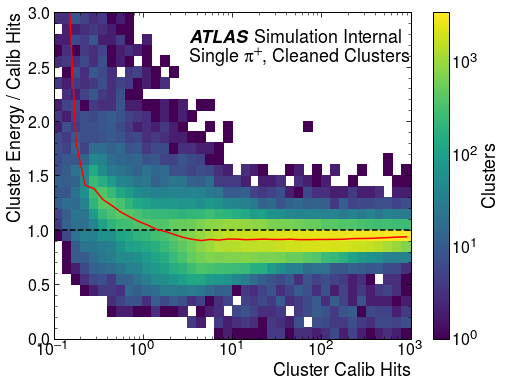

In [63]:
xcenter, medCleaned = ru.responsePlot(pp_Cleaned.cluster_ENG_CALIB_TOT, 
                      pp_Cleaned.clusterEoverCalib, 
                      figfile = plotpath+'hist_2D_calib_vs_ratio_pp_profile_Cleaned.pdf', statistic = 'median',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Cleaned Clusters'}])

Ok, that's reassuring: even with a pretty tight cleaning, things look pretty consistent to before!

<Figure size 576x432 with 0 Axes>

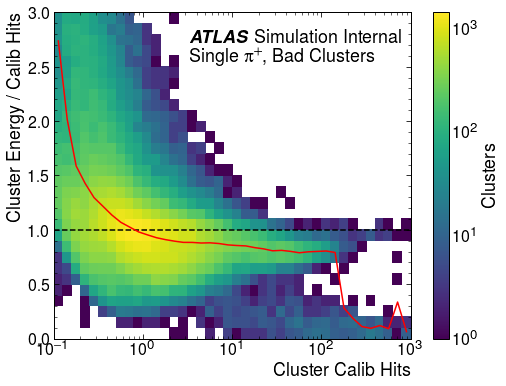

In [64]:
xcenter, medBad = ru.responsePlot(pp_Bad.cluster_ENG_CALIB_TOT, 
                      pp_Bad.clusterEoverCalib, 
                      figfile = plotpath+'hist_2D_calib_vs_ratio_pp_profile_Bad.pdf', statistic = 'median',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Bad Clusters'}])

The bad ones are also interesting. The low end agrees with ones we're used to, and it breaks down above-- probably due to just low stats. Not really appreciable stats over 20 GeV.

<Figure size 576x432 with 0 Axes>

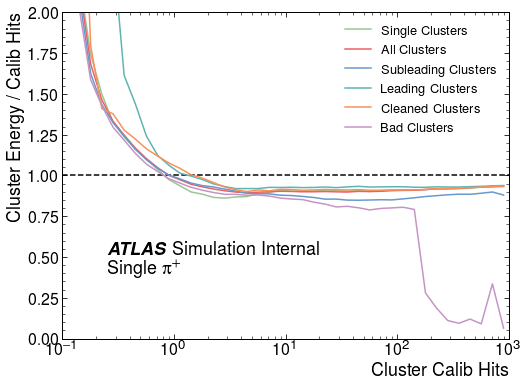

In [65]:
pu.lineOverlay(xcenter=xcenter, lines = [medSingle, medAll, medMulti, medLeading, medCleaned, medBad],
                labels=['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters', 'Cleaned Clusters', 'Bad Clusters'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                figfile = plotpath + 'hist_2D_calib_vs_ratio_pp_profile_OverlayCleanBad.pdf',
                extra_lines=[[[0.1,1000],[1,1]]],
                atlas_x = 0.1, atlas_y = 0.3, simulation = True,
                textlist = [{'x': 0.1, 'y': 0.2, 'text': 'Single $\pi^{+}$'}])

<Figure size 576x432 with 0 Axes>

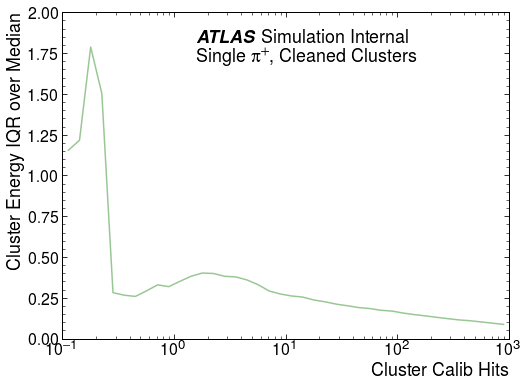

In [66]:
xcenter, iqrOverMedClean = ru.resolutionPlot(pp_Cleaned.cluster_ENG_CALIB_TOT, pp_Cleaned.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_pp_iqrMed_Clean.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{+}$, Cleaned Clusters'}])

<Figure size 576x432 with 0 Axes>

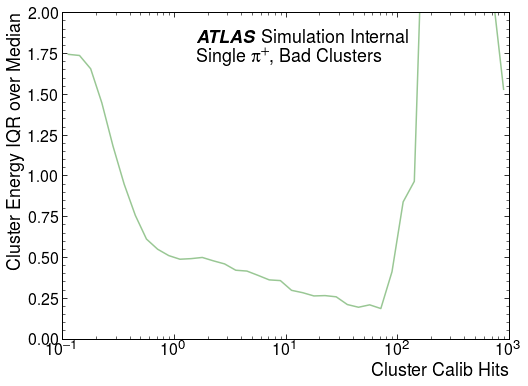

In [67]:
xcenter, iqrOverMedBad = ru.resolutionPlot(pp_Bad.cluster_ENG_CALIB_TOT, pp_Bad.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratio_pp_iqrMed_Bad.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{+}$, Bad Clusters'}])

<Figure size 576x432 with 0 Axes>

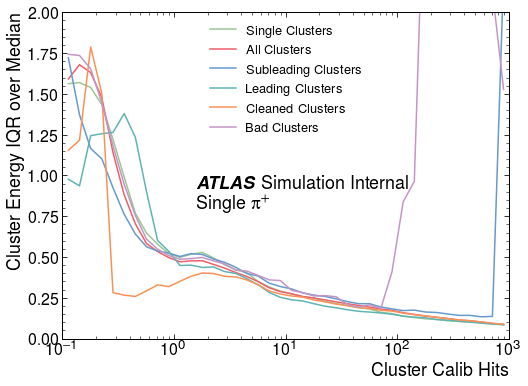

In [68]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedSingle, iqrOverMedAll, iqrOverMedMulti, iqrOverMedLeading, iqrOverMedClean, iqrOverMedBad],
                labels=['Single Clusters', 'All Clusters', 'Subleading Clusters', 'Leading Clusters', 'Cleaned Clusters', 'Bad Clusters'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy IQR over Median',
                figfile = plotpath + 'hist_2D_calib_vs_ratio_pp_iqrMed_OverlayCleanBad.pdf',
                x_min = 0.1, x_max = 1000, x_log = True,
                y_min = 0, y_max=2, y_log=False,
                atlas_x = 0.3, atlas_y = 0.5, simulation = True,
                textlist = [{'x': 0.3, 'y': 0.4, 'text': 'Single $\pi^{+}$'}])

Resolution also looks pretty consistent above 1 GeV. Below that, I don't understand why the Cleaned clusters have that almost-dip like shape.

/home/mswiatlowski/start_tf/caloml-atlas/util/plot_util.py:32: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alpha = 0.5, label=labels[i], zorder=zorder_start + i)


<Figure size 576x432 with 0 Axes>

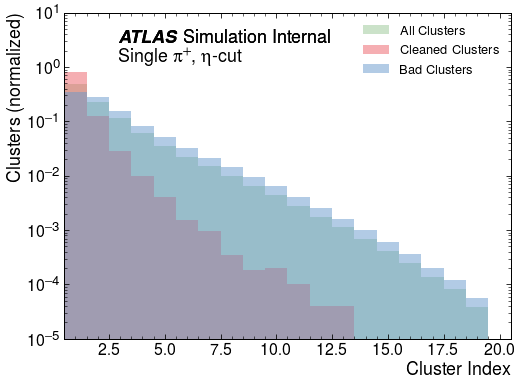

In [69]:
pu.histogramOverlay(frames = [pp_Eta, pp_Cleaned, pp_Bad],
                    data =  ['clusterIndex','clusterIndex', 'clusterIndex'],
                    labels =['All Clusters', 'Cleaned Clusters', 'Bad Clusters'],
                    xlabel = 'Cluster Index',
                    ylabel = 'Clusters (normalized)',
                    figfile = plotpath + '/hist_clusterIndex_etaCutClean.pdf',
                    x_min = 0.5, x_max = 20.5, xbins = 20, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$, $\eta$-cut'}])

Ok, so we are definitely cleaning out some junk at the higher end.

# Thoughts:

Generally speaking, it seems like the clusters are pretty consistently behaved, regardless of whether they're leading or subleading or even lower. If we clean away the 'bad' clusters, the story doesn't really change appreciably.

There are many subleading clusters close to the truth particle, and many that are far (and even some that are the leading cluster and far-- calorimeter missed the signal entirely!)

Bad clusters don't look entirely bad-- their resolutions and energies, as I've defined them, are basically reasonable. Their calibration hits seem reasonable.

The main thing I don't understand is why the resolution of the cleaned clusters has that funny dip, while inclusively it looks quite alright. Both the energy and calibration hits distributions look sane. Something to investigate next. Generally, it looks like something weird is going on with the calib hits near 1 GeV-- like there's a deficit there, which has an impact on the resolution.

# Debug the weird cleaned results

<Figure size 576x432 with 0 Axes>

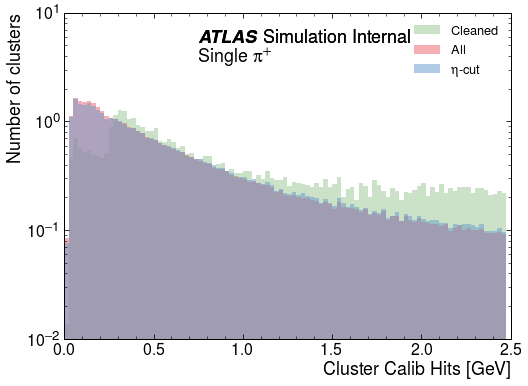

In [70]:
pu.histogramOverlay([pp_Cleaned, pp, pp_Eta], ['cluster_ENG_CALIB_TOT', 'cluster_ENG_CALIB_TOT', 'cluster_ENG_CALIB_TOT'], ['Cleaned', 'All', '$\eta$-cut'], 'Cluster Calib Hits [GeV]', 'Number of clusters',x_min = 0, x_max = 2.5, xbins = 100, y_log = True,
figfile=plotpath+'hist_calibHits_zoom_etaCutClean.pdf',
atlas_x = 0.3, atlas_y = 0.95, simulation = True, textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{+}$'}])

Welp, there we go: why does a DeltaR cut cause a peak like that? Very strange.

If we apply a Delta R cut, we're essentially saying: the particle has to get to the calorimeter and not be largely deflected. But at very, very low energy, that's unlikely to happen. So the cleaning is not so reliable down there, especially for measuring a resolution.

# Studying with respect to the full truth energy

In [71]:
pp_SCleaned = pp_Cleaned[pp_Cleaned.nCluster==1]

In [72]:
print(len(pp_Cleaned))
print(len(pp_SCleaned))

156519
39839


This is a very strict truth matching criteria. What do we see?

<Figure size 576x432 with 0 Axes>

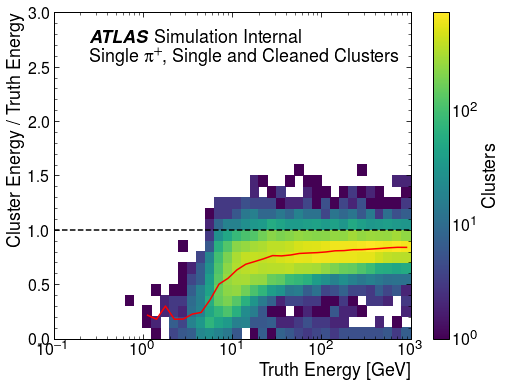

In [73]:
xcenter, medSingleCleanedTruth = ru.responsePlot(pp_SCleaned.truthE, 
                             pp_SCleaned.clusterEoverTruth, 
                             figfile = plotpath+'hist_2D_truth_vs_ratio_pp_profile_SingleCleaned.pdf', statistic = 'median',
                             xlabel='Truth Energy [GeV]', ylabel='Cluster Energy / Truth Energy',
                             atlas_x = 0.1, atlas_y = 0.95, simulation = True,
                             textlist = [{'x': 0.1, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single and Cleaned Clusters'}])

THis makes sense-- we see the usual response. But this is a very strict criteria, so we've lost nearly all pions near 0.1 GeV. If we don't apply the single cut, though, things are quite bad, see below.

<Figure size 576x432 with 0 Axes>

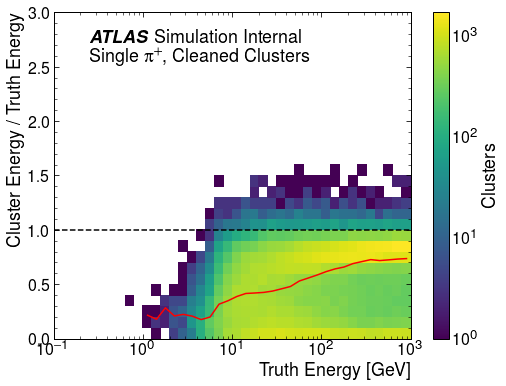

In [74]:
xcenter, medCleanedTruth = ru.responsePlot(pp_Cleaned.truthE, 
                             pp_Cleaned.clusterEoverTruth, 
                             figfile = plotpath+'hist_2D_truth_vs_ratio_pp_profile_Cleaned.pdf', statistic = 'median',
                             xlabel='Truth Energy [GeV]', ylabel='Cluster Energy / Truth Energy',
                             atlas_x = 0.1, atlas_y = 0.95, simulation = True,
                             textlist = [{'x': 0.1, 'y': 0.85, 'text': 'Single $\pi^{+}$, Cleaned Clusters'}])

/home/mswiatlowski/start_tf/caloml-atlas/util/plot_util.py:32: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alpha = 0.5, label=labels[i], zorder=zorder_start + i)


<Figure size 576x432 with 0 Axes>

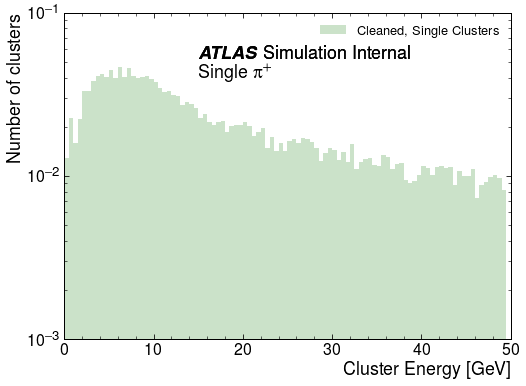

In [75]:
pu.histogramOverlay([pp_SCleaned], ['clusterE'], ['Cleaned, Single Clusters'], 'Cluster Energy [GeV]', 'Number of clusters',x_min = 0, x_max = 50, xbins = 100, y_log = True,
figfile=plotpath+'hist_energy_zoom_singleClean.pdf',
atlas_x = 0.3, atlas_y = 0.9, simulation = True, textlist = [{'x': 0.3, 'y': 0.8, 'text': 'Single $\pi^{+}$'}])

Applying the single, stringent cleaning criteria really shapes this-- we know we have many clusters below this, and we should probably be training them to do something reasonable. How about instead, we just apply the single cut, to the eta-cut sample. 



In [76]:

pp_SingleEta = pp_Eta[pp_Eta.nCluster==1]

Below is perhaps the most fair: cut on truth Eta, so there's an implicit DR match but not too tight. Then require single, so the truth particle is a decent proxy. We do see the upswing at the bottom, now that we have stats down there. 

<Figure size 576x432 with 0 Axes>

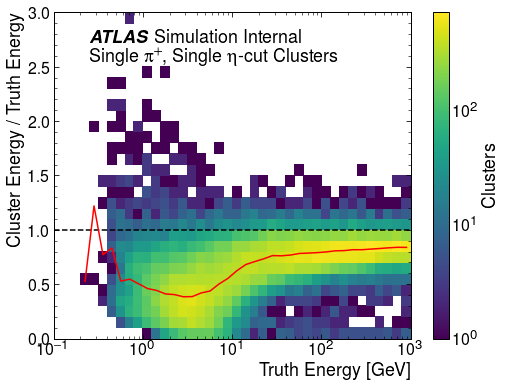

In [77]:
xcenter, medSingleTruth = ru.responsePlot(pp_SingleEta.truthE, 
                             pp_SingleEta.clusterEoverTruth, 
                             figfile = plotpath+'hist_2D_truth_vs_ratio_pp_profile_SingleEta.pdf', statistic = 'median',
                             xlabel='Truth Energy [GeV]', ylabel='Cluster Energy / Truth Energy',
                             atlas_x = 0.1, atlas_y = 0.95, simulation = True,
                             textlist = [{'x': 0.1, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single $\eta$-cut Clusters'}])

/home/mswiatlowski/start_tf/caloml-atlas/util/plot_util.py:32: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alpha = 0.5, label=labels[i], zorder=zorder_start + i)


<Figure size 576x432 with 0 Axes>

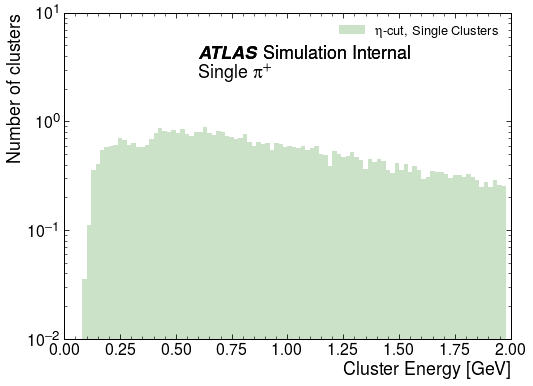

In [78]:
pu.histogramOverlay([pp_SingleEta], ['clusterE'], ['$\eta$-cut, Single Clusters'], 'Cluster Energy [GeV]', 'Number of clusters',x_min = 0, x_max = 2, xbins = 100, y_log = True,
figfile=plotpath+'hist_energy_zoom_singleEta.pdf',
atlas_x = 0.3, atlas_y = 0.9, simulation = True, textlist = [{'x': 0.3, 'y': 0.8, 'text': 'Single $\pi^{+}$'}])

This still has some bias at the lowest energies. We're clearly applying a filter of sorts here, still, which makes me think the calib hits are still the best bet, since we don't need the 'single' cut there.

## A validation question: for single cluster events, cluster calib hits + dead + ooc should be roughly the truth energy. Is it?

In [79]:
pp_SingleEta['cluster_ENG_ALL'] = pp_SingleEta.cluster_ENG_CALIB_TOT + pp_SingleEta.cluster_ENG_CALIB_OUT_T + pp_SingleEta.cluster_ENG_CALIB_DEAD_TOT
pp_SingleEta['truthEOverCalib'] = pp_SingleEta.cluster_ENG_ALL / pp_SingleEta.truthE

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<Figure size 576x432 with 0 Axes>

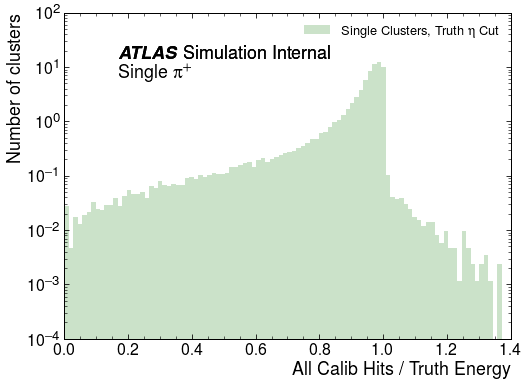

In [80]:
pu.histogramOverlay([pp_SingleEta], ['truthEOverCalib'], ['Single Clusters, Truth $\eta$ Cut'], 'All Calib Hits / Truth Energy', 'Number of clusters',x_min = 0, x_max = 1.4, xbins = 100, y_log = True,
figfile=plotpath+'hist_calibOverTruth_singleEta.pdf',
atlas_x = 0.12, atlas_y = 0.9, simulation = True, textlist = [{'x': 0.12, 'y': 0.8, 'text': 'Single $\pi^{+}$'}])

Pretty good agreement for the vast majority! Though a long falling tail raises questions... Let's compare responses calculated in various ways.

<Figure size 576x432 with 0 Axes>

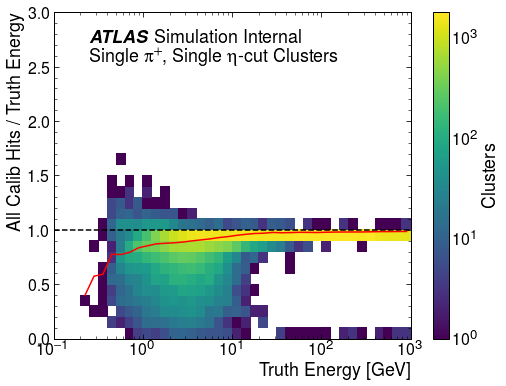

In [81]:
xcenter, medTruthVCalibOverTruth = ru.responsePlot( pp_SingleEta.truthE, 
                            pp_SingleEta.truthEOverCalib,
                             figfile = plotpath+'hist_2D_truth_vs_calibOverTruth_pp_profile_SingleEta.pdf', 
                             statistic = 'median',
                             xlabel='Truth Energy [GeV]', ylabel='All Calib Hits / Truth Energy',
                             atlas_x = 0.1, atlas_y = 0.95, simulation = True,
                             textlist = [{'x': 0.1, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single $\eta$-cut Clusters'}])

<Figure size 576x432 with 0 Axes>

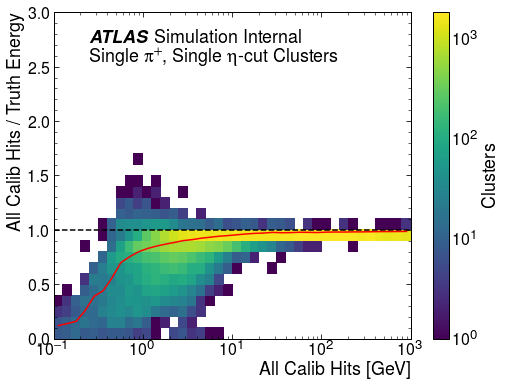

In [82]:
xcenter, medCalibVCalibOverTruth = ru.responsePlot( pp_SingleEta.cluster_ENG_ALL, 
                            pp_SingleEta.truthEOverCalib,
                             figfile = plotpath+'hist_2D_calib_vs_calibOverTruth_pp_profile_SingleEta.pdf', 
                             statistic = 'median',
                             xlabel='All Calib Hits [GeV]', ylabel='All Calib Hits / Truth Energy',
                             atlas_x = 0.1, atlas_y = 0.95, simulation = True,
                             textlist = [{'x': 0.1, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single $\eta$-cut Clusters'}])

Ok, so there's a fairly clear trend: at low Calib Hits, Calib Hits is too low, relative to truth energy. Are we seeing energy losses in the ID? Nuclear interaction lengths are 0.05 around here, so probably not.

It could be that at very low energy, the dead material and OOC are too tight-- too much scattering happening?

Another question: what does the response look like vs *all calib hits*, not just the deposited energy?

<Figure size 576x432 with 0 Axes>

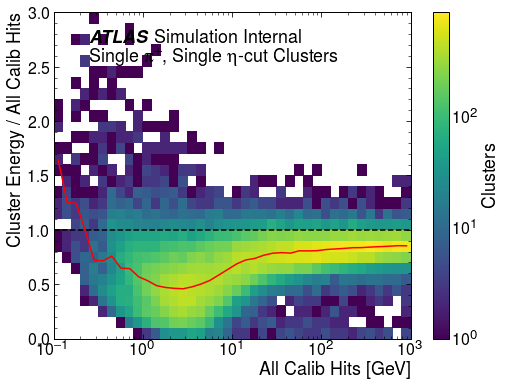

In [83]:
xcenter, medCalibAllVRatioAll = ru.responsePlot( pp_SingleEta.cluster_ENG_ALL, 
                            pp_SingleEta.clusterE / pp_SingleEta.cluster_ENG_ALL,
                             figfile = plotpath+'hist_2D_calibAll_vs_ratioAll_pp_profile_SingleEta.pdf', 
                             statistic = 'median',
                             xlabel='All Calib Hits [GeV]', ylabel='Cluster Energy / All Calib Hits',
                             atlas_x = 0.1, atlas_y = 0.95, simulation = True,
                             textlist = [{'x': 0.1, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single $\eta$-cut Clusters'}])

Much closer to 1, even at low energies. This is interesting: it may mean that three separate regressions are actually somewhat difficult to do. The OOC/DM energies are compensating for missed energy at low energies, it seems. What does the resolution look like?

<Figure size 576x432 with 0 Axes>

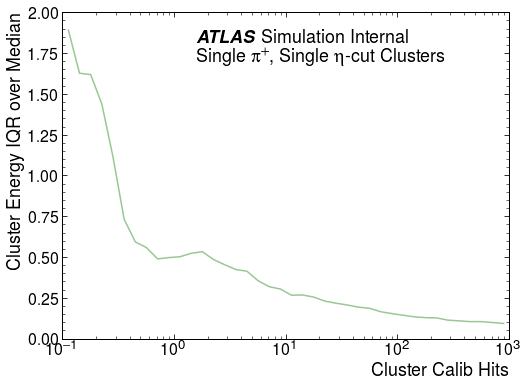

In [84]:
xcenter, iqrOverMedAllCalib = ru.resolutionPlot(pp_SingleEta.cluster_ENG_CALIB_TOT, pp_SingleEta.clusterEoverCalib,
                            plotpath+'hist_2D_calib_vs_ratioAll_pp_iqrMed_SingleEta.pdf', 
                            statistic='iqrOverMed',
                            atlas_x = 0.3, atlas_y = 0.95, simulation = True,
                            textlist = [{'x': 0.3, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single $\eta$-cut Clusters'}])

Resolution looks pretty normal-- some funny shapes as the response has a minimum, but normal besides?

So ok, truth and CalibAll have some differences, but ultimately this all depends on how things look as a function of the cluster Energy, sinc ethat's how we'll actually be applying things. How does that look?

<Figure size 576x432 with 0 Axes>

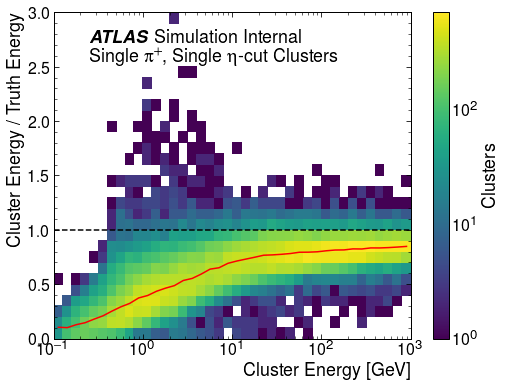

In [85]:
xcenter, medSingleEtaAllTruth = ru.responsePlot(pp_SingleEta.clusterE, 
                             pp_SingleEta.clusterEoverTruth, 
                             figfile = plotpath+'hist_2D_energy_vs_ratioETruth_pp_profile_SingleEta.pdf', 
                             statistic = 'median',
                             xlabel='Cluster Energy [GeV]', ylabel='Cluster Energy / Truth Energy',
                             atlas_x = 0.1, atlas_y = 0.95, simulation = True,
                             textlist = [{'x': 0.1, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single $\eta$-cut Clusters'}])

<Figure size 576x432 with 0 Axes>

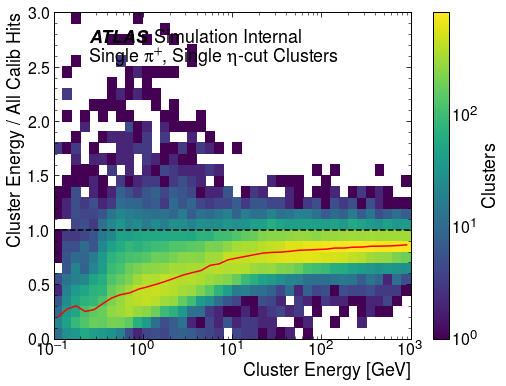

In [86]:
xcenter, medSingleEtaAllCalib = ru.responsePlot(pp_SingleEta.clusterE, 
                             pp_SingleEta.clusterE / pp_SingleEta.cluster_ENG_ALL, 
                             figfile = plotpath+'hist_2D_energy_vs_ratioCalibAll_pp_profile_SingleEta.pdf', 
                             statistic = 'median',
                             xlabel='Cluster Energy [GeV]', ylabel='Cluster Energy / All Calib Hits',
                             atlas_x = 0.1, atlas_y = 0.95, simulation = True,
                             textlist = [{'x': 0.1, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single $\eta$-cut Clusters'}])

<Figure size 576x432 with 0 Axes>

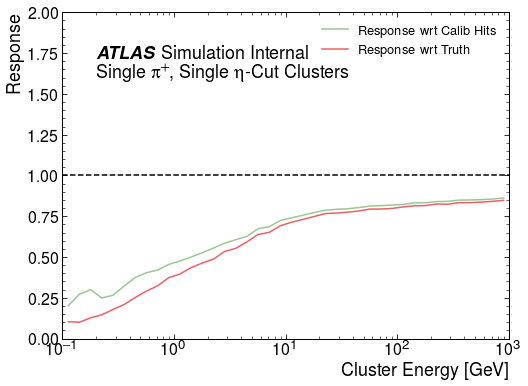

In [87]:
pu.lineOverlay(xcenter=xcenter, lines = [medSingleEtaAllCalib, medSingleEtaAllTruth],
                labels=['Response wrt Calib Hits', 'Response wrt Truth'],
                xlabel = 'Cluster Energy [GeV]', ylabel = 'Response',
                figfile = plotpath + 'hist_2D_energy_vs_ratiosOverlay_pp_profile_SingleEta.pdf',
                extra_lines=[[[0.1,1000],[1,1]]],
                atlas_x = 0.075, atlas_y = 0.9, simulation = True,
                textlist = [{'x': 0.075, 'y': 0.8, 'text': 'Single $\pi^{+}$, Single $\eta$-Cut Clusters'}])

Ok, so while things can look quite different-- utlimately for the clusters, this is the story. There's a bit of a difference in the calibration target at low energy, but not that much. Probably it's ok to just go with a choice.

# Conclusions

* Calib hits in general seem like a pretty decent target. There is a disagreement between calib hits and truth energy at the lowest energy regions, but in practice this will likely have little effect.
* Calib hits has the added advantage of being able to separate out the deposited, OOC, and dead energy.
* The regression code should be able to change target between three options, for this reason. 
    * Calib hits
    * Total calib hits
    * Truth energy
* We have to be careful with the cleaning we apply, if any. Choices like 'leading cluster' probably bias us: there's an implicit response selection there. 'Single cluster' seems safe, but DR to truth introduces clear biases, as indicated by the 'clean' plots above.
    * It's possible to define a cleaning criteria, like the single cluster, and compare to an inclusive training. The code should be modular to accomodate this, but that's fine. We might want to do a test comparing:
        * cleaned training vs cleaned testing
        * cleaned training vs inclusive testing
        * inclusive training vs cleaned testing
        * inclusive training vs inclusive testing
    * This will matter for the classification, as well as the regression.
* Ultimately what will matter is performance on jets!
